# **importing** ***library***

In [1]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [2]:
# importing library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
    accuracy_score,
)

# **Loading data**

In [3]:
# Load train and test datasets
train_df = pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/train.csv")
test_df = pd.read_csv("/kaggle/input/house-prices-advanced-regression-techniques/test.csv")

# Add a column to identify train and test samples
train_df['dataset'] = 'train'
test_df['dataset'] = 'test'

# Concatenate train and test datasets
dataset = pd.concat([train_df, test_df], ignore_index=True)

# Save merged dataset to a new CSV file
dataset.to_csv("merged_dataset.csv", index=False)


In [4]:
dataset

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0,train
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0,train
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0,train
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0,train
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,6,2006,WD,Normal,NaN,test
2915,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,4,2006,WD,Abnorml,NaN,test
2916,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,9,2006,WD,Abnorml,NaN,test
2917,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,NaN,MnPrv,Shed,700,7,2006,WD,Normal,NaN,test


In [5]:
dataset.sample(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
452,453,60,RL,NaN,9303,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,7,2007,WD,Normal,204000.0,train
1060,1061,120,RL,41.0,4920,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,4,2010,WD,Normal,213500.0,train
114,115,70,RL,61.0,7259,Pave,NaN,IR1,Lvl,AllPub,...,NaN,MnPrv,NaN,0,7,2007,WD,Normal,259500.0,train
2315,2316,60,RL,63.0,9729,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,6,2007,New,Partial,NaN,test
641,642,60,FV,NaN,7050,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,5,2007,WD,Normal,226000.0,train
2364,2365,120,FV,45.0,4379,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,7,2007,WD,Normal,NaN,test
2151,2152,30,RL,85.0,19550,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,1,2008,WD,Normal,NaN,test
976,977,30,RL,51.0,5900,Pave,NaN,IR1,Bnk,AllPub,...,NaN,NaN,NaN,0,8,2006,WD,Normal,85500.0,train
394,395,50,RL,60.0,10134,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,7,2007,WD,Normal,109000.0,train
504,505,160,RL,24.0,2308,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,6,2009,WD,Normal,147000.0,train


# Data Description

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          198 non-null    object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallC

In [7]:
dataset.describe().T.style.background_gradient(cmap='YlOrRd')

,count,mean,std,min,25%,50%,75%,max
Id,2919.000000,1460.000000,842.787043,1.000000,730.500000,1460.000000,2189.500000,2919.000000
MSSubClass,2919.000000,57.137718,42.517628,20.000000,20.000000,50.000000,70.000000,190.000000
LotFrontage,2433.000000,69.305795,23.344905,21.000000,59.000000,68.000000,80.000000,313.000000
LotArea,2919.000000,10168.114080,7886.996359,1300.000000,7478.000000,9453.000000,11570.000000,215245.000000
OverallQual,2919.000000,6.089072,1.409947,1.000000,5.000000,6.000000,7.000000,10.000000
OverallCond,2919.000000,5.564577,1.113131,1.000000,5.000000,5.000000,6.000000,9.000000
YearBuilt,2919.000000,1971.312778,30.291442,1872.000000,1953.500000,1973.000000,2001.000000,2010.000000
YearRemodAdd,2919.000000,1984.264474,20.894344,1950.000000,1965.000000,1993.000000,2004.000000,2010.000000
MasVnrArea,2896.000000,102.201312,179.334253,0.000000,0.000000,0.000000,164.000000,1600.000000
BsmtFinSF1,2918.000000,441.423235,455.610826,0.000000,0.000000,368.500000,733.000000,5644.000000


In [8]:
dataset.describe()[1:].T.style.background_gradient(cmap='YlOrRd')

,mean,std,min,25%,50%,75%,max
Id,1460.000000,842.787043,1.000000,730.500000,1460.000000,2189.500000,2919.000000
MSSubClass,57.137718,42.517628,20.000000,20.000000,50.000000,70.000000,190.000000
LotFrontage,69.305795,23.344905,21.000000,59.000000,68.000000,80.000000,313.000000
LotArea,10168.114080,7886.996359,1300.000000,7478.000000,9453.000000,11570.000000,215245.000000
OverallQual,6.089072,1.409947,1.000000,5.000000,6.000000,7.000000,10.000000
OverallCond,5.564577,1.113131,1.000000,5.000000,5.000000,6.000000,9.000000
YearBuilt,1971.312778,30.291442,1872.000000,1953.500000,1973.000000,2001.000000,2010.000000
YearRemodAdd,1984.264474,20.894344,1950.000000,1965.000000,1993.000000,2004.000000,2010.000000
MasVnrArea,102.201312,179.334253,0.000000,0.000000,0.000000,164.000000,1600.000000
BsmtFinSF1,441.423235,455.610826,0.000000,0.000000,368.500000,733.000000,5644.000000


In [9]:
Numerical_columns=dataset.select_dtypes(exclude='object')
Numerical_columns

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706.0,...,0,61,0,0,0,0,0,2,2008,208500.0
1,2,20,80.0,9600,6,8,1976,1976,0.0,978.0,...,298,0,0,0,0,0,0,5,2007,181500.0
2,3,60,68.0,11250,7,5,2001,2002,162.0,486.0,...,0,42,0,0,0,0,0,9,2008,223500.0
3,4,70,60.0,9550,7,5,1915,1970,0.0,216.0,...,0,35,272,0,0,0,0,2,2006,140000.0
4,5,60,84.0,14260,8,5,2000,2000,350.0,655.0,...,192,84,0,0,0,0,0,12,2008,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2915,160,21.0,1936,4,7,1970,1970,0.0,0.0,...,0,0,0,0,0,0,0,6,2006,NaN
2915,2916,160,21.0,1894,4,5,1970,1970,0.0,252.0,...,0,24,0,0,0,0,0,4,2006,NaN
2916,2917,20,160.0,20000,5,7,1960,1996,0.0,1224.0,...,474,0,0,0,0,0,0,9,2006,NaN
2917,2918,85,62.0,10441,5,5,1992,1992,0.0,337.0,...,80,32,0,0,0,0,700,7,2006,NaN


In [10]:
Numerical=dataset.select_dtypes(exclude='object').columns.tolist()
Numerical

['Id',
 'MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice']

In [11]:
Categorical=dataset.select_dtypes(include='object').columns.tolist()
Categorical

['MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'SaleType',
 'SaleCondition',
 'dataset']

# EDA

**correlation matrix**

<Axes: >

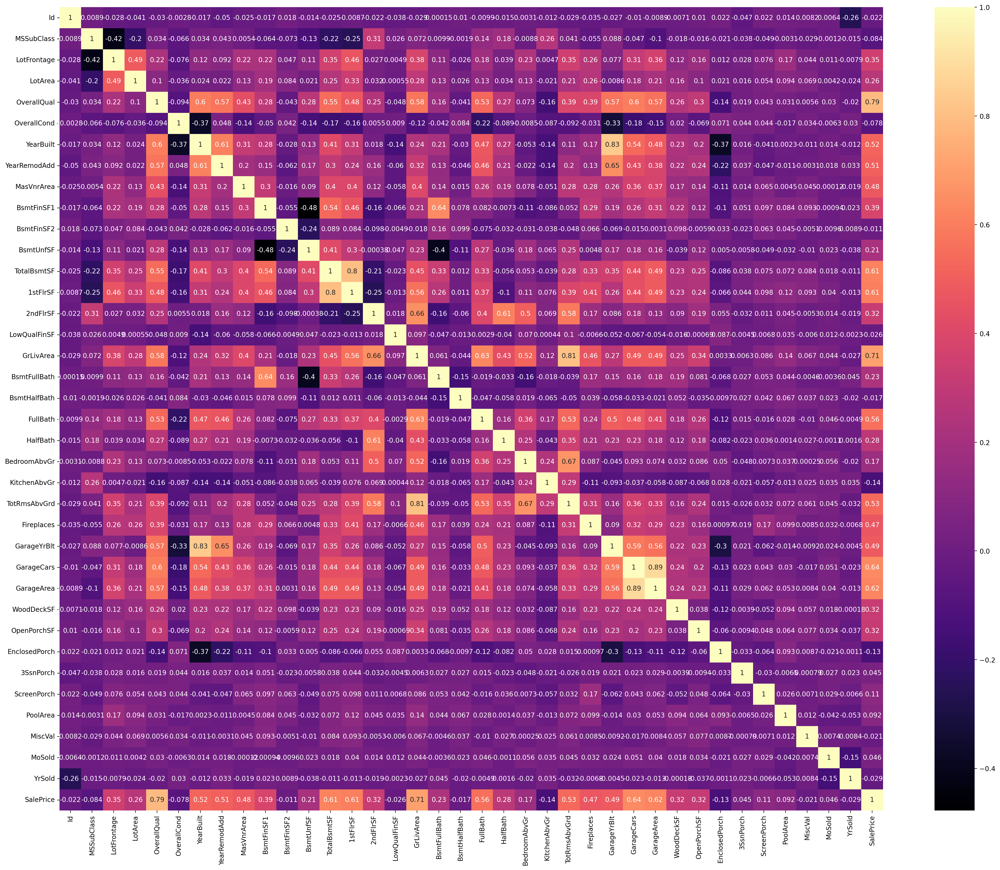

In [12]:
plt.figure(figsize=(28, 22), dpi = 200)
sns.heatmap(Numerical_columns.corr(), annot = True, cbar = True, cmap = 'magma')

**visualize numerical feature**

/tmp/ipykernel_18/1898686359.py:34: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=dataset[var_name], bins=10, color=colors[i], ax=ax)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_18/1898686359.py:34: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-

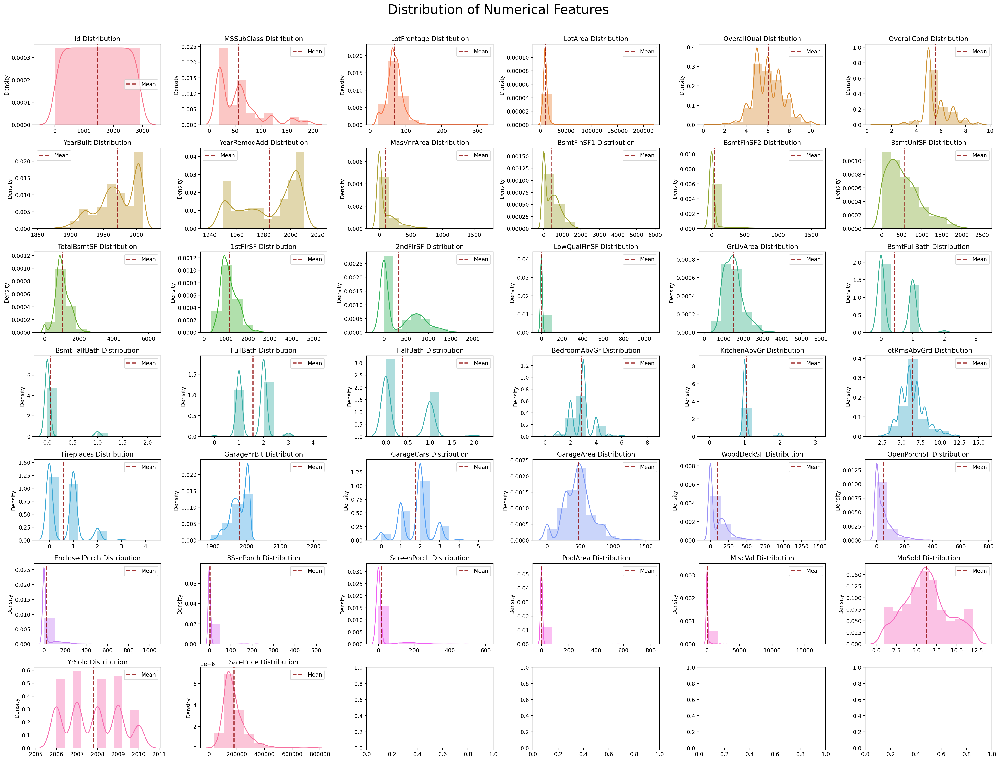

In [13]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def draw_distplot(dataset, numerical_features, n_rows=7, n_cols=7):
    """
    Creates a distribution plot for numerical features in a dataset.

    Args:
        dataset (pandas.DataFrame): The dataset containing the features.
        numerical_features (list): A list of numerical feature names in the dataset.
        n_rows (int, optional): The number of rows in the subplot grid. Defaults to 7.
        n_cols (int, optional): The number of columns in the subplot grid. Defaults to 7.
    """

    if not isinstance(dataset, pd.DataFrame):
        raise ValueError("dataset must be a pandas.DataFrame")

    if not all(feature in dataset.columns for feature in numerical_features):
        missing_features = [feature for feature in numerical_features if feature not in dataset.columns]
        raise ValueError(f"Features not found in dataset: {', '.join(missing_features)}")

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(26, 20), dpi=200)

    # Ensure compatibility with subplots (flatten if necessary)
    axes = axes.ravel() if len(axes.shape) > 1 else axes

    # Custom color palette for better aesthetics
    colors = sns.color_palette("husl", n_colors=len(numerical_features))

    for i, var_name in enumerate(numerical_features):
        ax = axes[i]
        sns.distplot(x=dataset[var_name], bins=10, color=colors[i], ax=ax)
        ax.set_title(var_name + " Distribution")

        # Add a vertical line at the mean
        mean_value = np.mean(dataset[var_name])
        ax.axvline(mean_value, color='darkred', linestyle='dashed', linewidth=2, label='Mean', alpha=0.8)

        # Add legend
        ax.legend(loc='best')

    fig.suptitle('Distribution of Numerical Features', fontsize=24)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# Example usage (assuming 'Numerical' is a list of numerical features in your dataset)
draw_distplot(dataset, Numerical, 7, 6)


**visaluze categorical feature**

In [14]:
def draw_countplot(dataset, variables, n_rows, n_cols):
    fig = plt.figure(figsize=(50, 40), dpi = 200)
    fig.suptitle('Barplot for Categorical Features', fontsize =30)

    colors = sns.color_palette('pastel', n_colors=len(variables))
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i + 1)
        sns.countplot(x = dataset[var_name], color=colors[i], ax = ax)
        ax.set_title(var_name + ' Distribution')

        ax.legend(loc = 'best')
    plt.tight_layout(rect = [0, 0, 1, 0.97])
    plt.show()

In [15]:
draw_countplot(dataset, Categorical, 15, 3)

In [16]:
data=dataset.copy()

In [17]:
from sklearn.preprocessing import LabelEncoder
lst = list(data.select_dtypes('object').columns)



for i in lst :

  lb = LabelEncoder()

  data[i] = lb.fit_transform(data[i])

**correlation between target "SalesPrice" and other features**

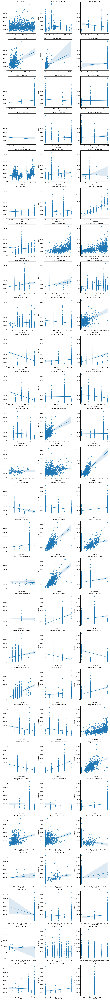

In [18]:
columns_to_plot = [col for col in dataset.columns if col != 'SalePrice']
num_cols = 3
num_rows = int(np.ceil(len(columns_to_plot) / num_cols))
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5*num_rows))
for i, col in enumerate(columns_to_plot):
    row_index = i // num_cols
    col_index = i % num_cols
    sns.regplot(data=data, x=col, y='SalePrice', ax=axes[row_index, col_index])
    axes[row_index, col_index].set_title(f'{col} vs SalePrice')

num_features = len(columns_to_plot)
for i in range(num_features, num_rows*num_cols):
    axes.flatten()[i].axis('off')
plt.tight_layout()
plt.show()

# Preprocessing Data

***1.checking outlier***

**handling outlier**

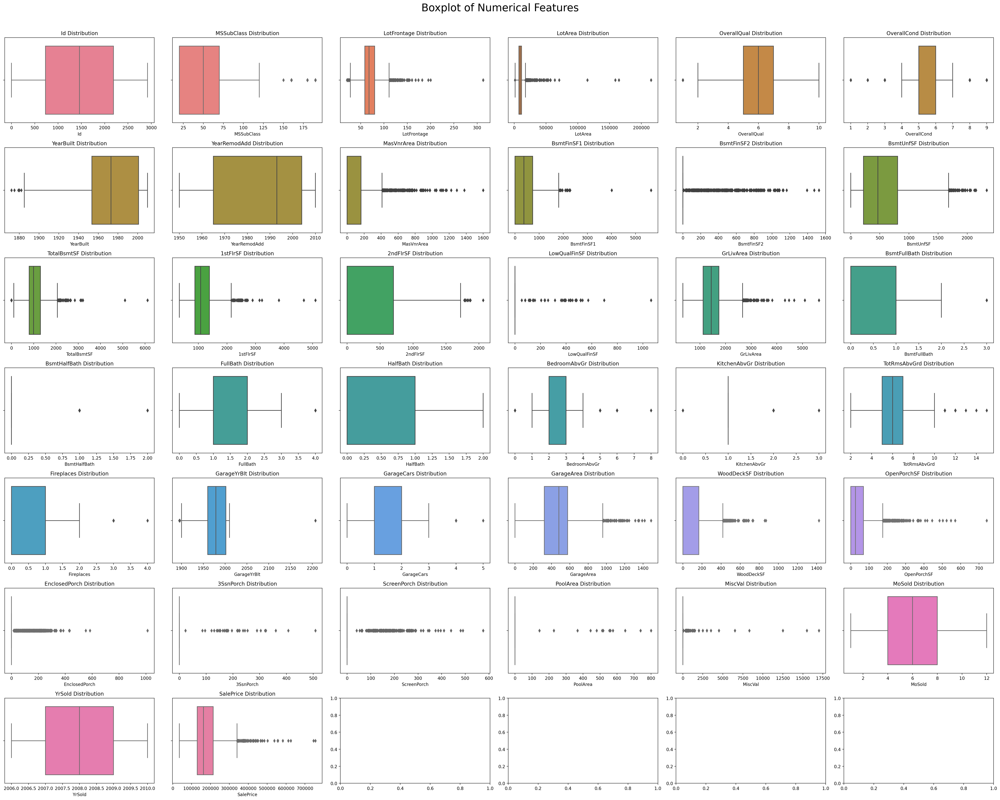

In [19]:
import seaborn as sns

def draw_boxplot(dataset, variables, n_rows, n_cols):
    """
    Creates a boxplot for numerical features in a dataset using color cycling.

    Args:
        dataset (pandas.DataFrame): The dataset containing the features.
        variables (list): A list of numerical feature names in the dataset.
        n_rows (int, optional): The number of rows in the subplot grid. Defaults to 6.
        n_cols (int, optional): The number of columns in the subplot grid. Defaults to 6.
    """

    if not isinstance(dataset, pd.DataFrame):
        raise ValueError("dataset must be a pandas.DataFrame")

    if not all(feature in dataset.columns for feature in variables):
        missing_features = [feature for feature in variables if feature not in dataset.columns]
        raise ValueError(f"Features not found in dataset: {', '.join(missing_features)}")

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(32, 26), dpi=200)

    # Ensure compatibility with subplots (flatten if necessary)
    axes = axes.ravel() if len(axes.shape) > 1 else axes

    # Color cycling with seaborn's husl_palette
    palette = sns.color_palette("husl", n_colors=len(variables))

    for i, var_name in enumerate(variables):
        ax = axes[i]
        sns.boxplot(x=dataset[var_name], color=palette[i], ax=ax)
        ax.set_title(var_name + " Distribution")

        # Add a vertical line at the mean (optional, uncomment if needed)
        # mean_value = np.mean(dataset[var_name])
        # ax.axvline(mean_value, color='darkred', linestyle='dashed', linewidth=2, label='Mean', alpha=0.8)

        # Add legend (optional, uncomment if needed)
        # ax.legend(loc='best')

    fig.suptitle('Boxplot of Numerical Features', fontsize=24)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

# Example usage (assuming 'Numerical' is a list of numerical features)
draw_boxplot(dataset, Numerical, 7, 6)


In [20]:
def remove_outliers(dataset, variables):
    for i , var_name in enumerate(variables):
        q1 = dataset[var_name].quantile(0.25)
        q3 = dataset[var_name].quantile(0.75)
        iqr = q3 - q1
        upper_limit = q3 + 1.5*iqr
        lower_limit = q1 - 1.5*iqr
        print('Variable Name: ',var_name)
        print('Q1: ',q1)
        print('Q3: ',q3)
        print('IQR: ',iqr)
        print('Upper Limit: ',upper_limit)
        print('Lower Limit: ',lower_limit)
        print('* ' * 20)

        dataset[var_name] = np.where(dataset[var_name] > upper_limit, upper_limit, np.where(dataset[var_name] < lower_limit, lower_limit, dataset[var_name]))

In [21]:
remove_outliers(dataset, Numerical)

Variable Name:  Id
Q1:  730.5
Q3:  2189.5
IQR:  1459.0
Upper Limit:  4378.0
Lower Limit:  -1458.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  MSSubClass
Q1:  20.0
Q3:  70.0
IQR:  50.0
Upper Limit:  145.0
Lower Limit:  -55.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  LotFrontage
Q1:  59.0
Q3:  80.0
IQR:  21.0
Upper Limit:  111.5
Lower Limit:  27.5
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  LotArea
Q1:  7478.0
Q3:  11570.0
IQR:  4092.0
Upper Limit:  17708.0
Lower Limit:  1340.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  OverallQual
Q1:  5.0
Q3:  7.0
IQR:  2.0
Upper Limit:  10.0
Lower Limit:  2.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  OverallCond
Q1:  5.0
Q3:  6.0
IQR:  1.0
Upper Limit:  7.5
Lower Limit:  3.5
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  YearBuilt
Q1:  1953.5
Q3:  2001.0
IQR:  47.5
Upper Limit:  2072.25
Lower Limit:  1882.25
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  YearRemo

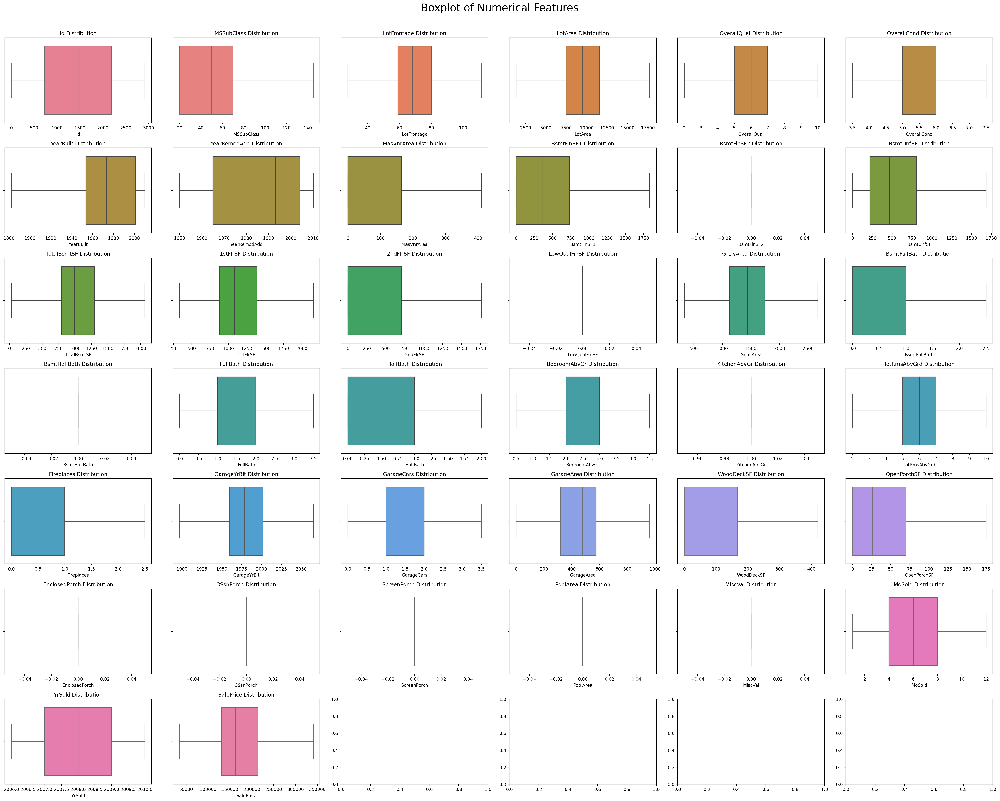

In [22]:
draw_boxplot(dataset, Numerical, 7, 6)

**2.checking null values**

In [23]:
dataset.isnull().sum().sort_values()

Id                0
Foundation        0
Heating           0
CentralAir        0
1stFlrSF          0
               ... 
MasVnrType     1766
Fence          2348
Alley          2721
MiscFeature    2814
PoolQC         2909
Length: 82, dtype: int64

<Axes: >

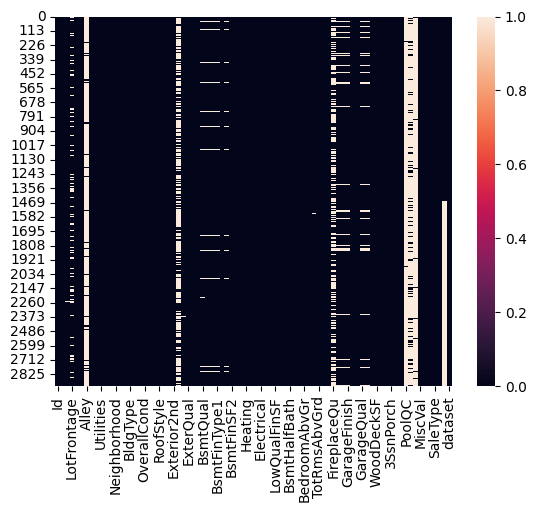

In [24]:
sns.heatmap(dataset.isnull())

In [25]:
pd.set_option('display.max_rows', None)
null_values=(dataset.isna().sum()/len(dataset) * 100).sort_values(ascending=False)
null_values

PoolQC           99.657417
MiscFeature      96.402878
Alley            93.216855
Fence            80.438506
MasVnrType       60.500171
SalePrice        49.982871
FireplaceQu      48.646797
LotFrontage      16.649538
GarageCond        5.447071
GarageFinish      5.447071
GarageYrBlt       5.447071
GarageQual        5.447071
GarageType        5.378554
BsmtExposure      2.809181
BsmtCond          2.809181
BsmtQual          2.774923
BsmtFinType2      2.740665
BsmtFinType1      2.706406
MasVnrArea        0.787941
MSZoning          0.137033
Functional        0.068517
BsmtFullBath      0.068517
Utilities         0.068517
BsmtHalfBath      0.068517
BsmtFinSF1        0.034258
GarageCars        0.034258
GarageArea        0.034258
Electrical        0.034258
TotalBsmtSF       0.034258
Exterior2nd       0.034258
Exterior1st       0.034258
BsmtUnfSF         0.034258
SaleType          0.034258
KitchenQual       0.034258
BsmtFinSF2        0.034258
Fireplaces        0.000000
TotRmsAbvGrd      0.000000
I

**handling null values**

In [26]:
# removing columns with null values (more than 90%)
dataset.drop(columns = ['MiscFeature', 'Fence', 'PoolQC', 'FireplaceQu', 'Alley', 'LotFrontage'], axis = 1, inplace = True)

**fill missing value with mean and mode**

In [27]:
dataset['SalePrice'].describe()

count      1460.000000
mean     177331.526370
std       67205.835915
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      340037.500000
Name: SalePrice, dtype: float64

/tmp/ipykernel_18/3994456427.py:1: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(dataset['SalePrice'], shade=True, bw=0.5, color="olive")
/tmp/ipykernel_18/3994456427.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(dataset['SalePrice'], shade=True, bw=0.5, color="olive")
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


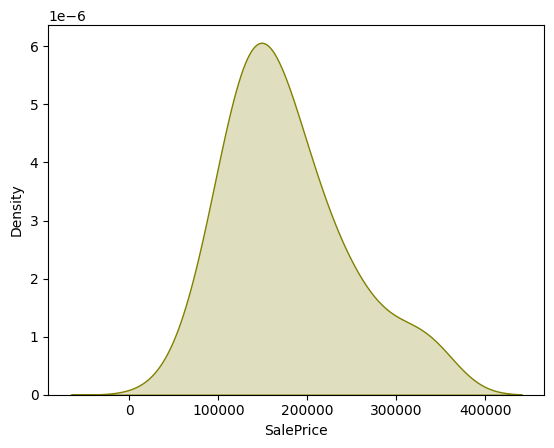

In [28]:
sns.kdeplot(dataset['SalePrice'], shade=True, bw=0.5, color="olive")
plt.show()

In [29]:
dataset['SalePrice']= dataset['SalePrice'].fillna(dataset['SalePrice'].mode())

/tmp/ipykernel_18/3994456427.py:1: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.5`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(dataset['SalePrice'], shade=True, bw=0.5, color="olive")
/tmp/ipykernel_18/3994456427.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(dataset['SalePrice'], shade=True, bw=0.5, color="olive")
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


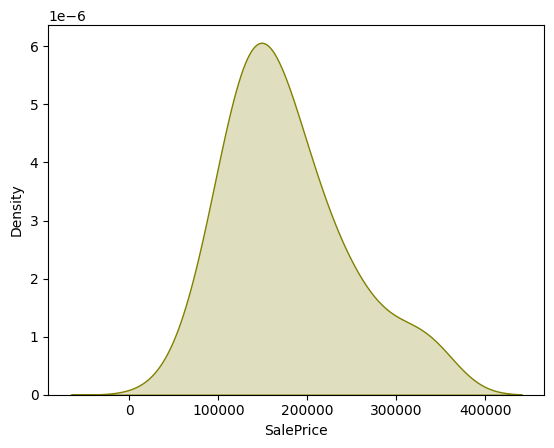

In [30]:
sns.kdeplot(dataset['SalePrice'], shade=True, bw=0.5, color="olive")
plt.show()

In [31]:
dataset['SalePrice'].describe()

count      1460.000000
mean     177331.526370
std       67205.835915
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      340037.500000
Name: SalePrice, dtype: float64

In [32]:
for i in dataset.select_dtypes(exclude='object').columns:
    dataset[i] = dataset[i].fillna(dataset[i].mean())

In [33]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2919.0,1460.000000,842.787043,1.00,730.5,1460.000000,2189.50000,2919.00
MSSubClass,2919.0,55.334018,37.790000,20.00,20.0,50.000000,70.00000,145.00
LotArea,2919.0,9576.512847,3611.992836,1340.00,7478.0,9453.000000,11570.00000,17708.00
OverallQual,2919.0,6.090442,1.405478,2.00,5.0,6.000000,7.00000,10.00
OverallCond,2919.0,5.538541,0.953406,3.50,5.0,5.000000,6.00000,7.50
YearBuilt,2919.0,1971.323827,30.257831,1882.25,1953.5,1973.000000,2001.00000,2010.00
YearRemodAdd,2919.0,1984.264474,20.894344,1950.00,1965.0,1993.000000,2004.00000,2010.00
MasVnrArea,2919.0,88.611533,133.275123,0.00,0.0,0.000000,163.50000,410.00
BsmtFinSF1,2919.0,438.269877,437.897086,0.00,0.0,369.000000,733.00000,1832.50
BsmtFinSF2,2919.0,0.000000,0.000000,0.00,0.0,0.000000,0.00000,0.00


In [34]:
dataset.describe(include = "object").T


,count,unique,top,freq
MSZoning,2915,5,RL,2265
Street,2919,2,Pave,2907
LotShape,2919,4,Reg,1859
LandContour,2919,4,Lvl,2622
Utilities,2917,2,AllPub,2916
LotConfig,2919,5,Inside,2133
LandSlope,2919,3,Gtl,2778
Neighborhood,2919,25,NAmes,443
Condition1,2919,9,Norm,2511
Condition2,2919,8,Norm,2889


In [35]:
for i in dataset.select_dtypes(include = ['object']).columns:
    dataset[i] = dataset[i].fillna(dataset[i].mode()[0])

<Axes: >

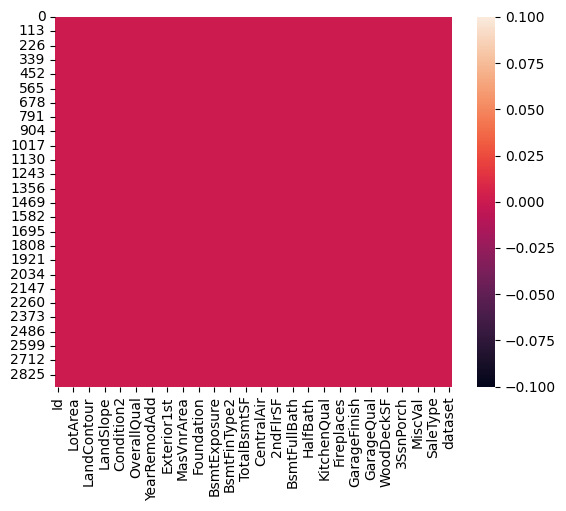

In [36]:
sns.heatmap(dataset.isnull())

In [37]:
pd.set_option('display.max_rows', None)
null_values=(dataset.isna().sum()/len(dataset) * 100).sort_values(ascending=False)
null_values

Id               0.0
HalfBath         0.0
GarageType       0.0
Fireplaces       0.0
Functional       0.0
TotRmsAbvGrd     0.0
KitchenQual      0.0
KitchenAbvGr     0.0
BedroomAbvGr     0.0
FullBath         0.0
MSSubClass       0.0
BsmtHalfBath     0.0
BsmtFullBath     0.0
GrLivArea        0.0
LowQualFinSF     0.0
2ndFlrSF         0.0
1stFlrSF         0.0
Electrical       0.0
GarageYrBlt      0.0
GarageFinish     0.0
GarageCars       0.0
GarageArea       0.0
SalePrice        0.0
SaleCondition    0.0
SaleType         0.0
YrSold           0.0
MoSold           0.0
MiscVal          0.0
PoolArea         0.0
ScreenPorch      0.0
3SsnPorch        0.0
EnclosedPorch    0.0
OpenPorchSF      0.0
WoodDeckSF       0.0
PavedDrive       0.0
GarageCond       0.0
GarageQual       0.0
CentralAir       0.0
HeatingQC        0.0
Heating          0.0
YearRemodAdd     0.0
OverallCond      0.0
OverallQual      0.0
HouseStyle       0.0
BldgType         0.0
Condition2       0.0
Condition1       0.0
Neighborhood 

In [38]:
dataset.isnull().sum().sum()

0

In [39]:
dataset.duplicated().sum()

0

**3.encoding using label encoding**

In [40]:
from sklearn.preprocessing import LabelEncoder
lst = list(dataset.select_dtypes('object').columns)



for i in lst :

  lb = LabelEncoder()

  dataset[i] = lb.fit_transform(dataset[i])

In [41]:
dataset.shape

(2919, 76)

# modeling

In [42]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test=train_test_split(dataset.drop(columns=["SalePrice"]),
                                                  dataset["SalePrice"],
                                                  test_size=0.3, random_state=50)

In [43]:
x_train.shape

(2043, 75)

In [44]:
x_test.shape

(876, 75)

In [45]:
test_df=x_test.copy()

In [46]:
x_train.drop(columns=["Id"], axis = 1, inplace = True)
x_test.drop(columns=["Id"], axis = 1, inplace = True)

**1.linear Regression**

In [47]:
lin_reg = LinearRegression()
lin_reg

LinearRegression()

In [48]:
lin_reg.fit(x_train, y_train)
train_prediction = lin_reg.predict(x_train)
test_prediction = lin_reg.predict(x_test)

score_train = r2_score(y_true=y_train, y_pred=train_prediction)

score_test = r2_score(y_true=y_test, y_pred=test_prediction)
print("train score = ", score_train)
print("test score = ", score_test)

train score =  0.45951324149459705
test score =  0.4314264543831784


In [49]:
MAE = mean_absolute_error(y_true=y_test, y_pred=test_prediction)
MSE = mean_squared_error(y_true=y_test, y_pred=test_prediction)
RMSE = np.sqrt(mean_absolute_error(y_true=y_test, y_pred=test_prediction))
print("MAE = ", MAE)
print("MSE = ", MSE)
print("RMSE = ", RMSE)
print("acc_score = ", score_test)

MAE =  28465.616939958254
MSE =  1374152374.1309652
RMSE =  168.71756559397795
acc_score =  0.4314264543831784


**2.AdaBoostRegressor**

In [50]:
from sklearn.ensemble import AdaBoostRegressor

model2 = AdaBoostRegressor()
model2.fit(x_train,y_train)

train_prediction = model2.predict(x_train)
test_prediction = model2.predict(x_test)

score_train = r2_score(y_true=y_train, y_pred=train_prediction)

score_test = r2_score(y_true=y_test, y_pred=test_prediction)

In [51]:
print("train score = ", score_train)
print("test score = ", score_test)

train score =  0.7468206995046954
test score =  0.7357861190549277


3.**XGBoost**

In [52]:
from xgboost import XGBRegressor

model3 = XGBRegressor()
model3.fit(x_train,y_train)

train_prediction = model3.predict(x_train)
test_prediction = model3.predict(x_test)

score_train = r2_score(y_true=y_train, y_pred=train_prediction)

score_test = r2_score(y_true=y_test, y_pred=test_prediction)
print("train score = ", score_train)
print("test score = ", score_test)

train score =  0.9994706622967363
test score =  0.898055399032802


In [53]:
MAE = mean_absolute_error(y_true=y_test, y_pred=test_prediction)
MSE = mean_squared_error(y_true=y_test, y_pred=test_prediction)
RMSE = np.sqrt(mean_absolute_error(y_true=y_test, y_pred=test_prediction))
print("MAE = ", MAE)
print("MSE = ", MSE)
print("RMSE = ", RMSE)
print("acc_score = ", score_test)

MAE =  8554.433695272917
MSE =  246383984.1456819
RMSE =  92.49018161552564
acc_score =  0.898055399032802


In [54]:
data = {
    "model": "XGBRegressor",
    "MAE": MAE,
    "MSE": MSE,
    "RMSE": RMSE,
    "train_score": score_train,
    "test_score": score_test,
}
data

{'model': 'XGBRegressor',
 'MAE': 8554.433695272917,
 'MSE': 246383984.1456819,
 'RMSE': 92.49018161552564,
 'train_score': 0.9994706622967363,
 'test_score': 0.898055399032802}

**4.CatBoostRegressor**

In [55]:
from catboost import CatBoostRegressor

In [56]:
model4 = CatBoostRegressor()
model4.fit(x_train,y_train)

train_prediction = model4.predict(x_train)
test_prediction = model4.predict(x_test)

score_train = r2_score(y_true=y_train, y_pred=train_prediction)

score_test = r2_score(y_true=y_test, y_pred=test_prediction)
print("train score = ", score_train)
print("test score = ", score_test)

Learning rate set to 0.045835
0:	learn: 45347.8622497	total: 58.4ms	remaining: 58.3s
1:	learn: 44037.4551420	total: 61.1ms	remaining: 30.5s
2:	learn: 42721.4336640	total: 63.7ms	remaining: 21.2s
3:	learn: 41417.2316164	total: 66.1ms	remaining: 16.4s
4:	learn: 40214.1670308	total: 68.2ms	remaining: 13.6s
5:	learn: 39034.6783700	total: 70.3ms	remaining: 11.6s
6:	learn: 37887.2127114	total: 72.4ms	remaining: 10.3s
7:	learn: 36800.8123896	total: 74.4ms	remaining: 9.23s
8:	learn: 35824.4635691	total: 76.6ms	remaining: 8.43s
9:	learn: 34809.3062849	total: 78.6ms	remaining: 7.79s
10:	learn: 33894.0772259	total: 80.6ms	remaining: 7.25s
11:	learn: 33004.8826524	total: 82.8ms	remaining: 6.81s
12:	learn: 32115.8843406	total: 84.8ms	remaining: 6.44s
13:	learn: 31311.2221439	total: 86.9ms	remaining: 6.12s
14:	learn: 30487.9802425	total: 88.9ms	remaining: 5.83s
15:	learn: 29661.8223727	total: 90.9ms	remaining: 5.59s
16:	learn: 28965.3343809	total: 92.8ms	remaining: 5.37s
17:	learn: 28305.0274802	tot

In [57]:
MAE = mean_absolute_error(y_true=y_test, y_pred=test_prediction)
MSE = mean_squared_error(y_true=y_test, y_pred=test_prediction)
RMSE = np.sqrt(mean_absolute_error(y_true=y_test, y_pred=test_prediction))
print("MAE = ", MAE)
print("MSE = ", MSE)
print("RMSE = ", RMSE)
print("acc_score = ", score_test)

MAE =  7587.645988591092
MSE =  208100934.73232323
RMSE =  87.10709493830622
acc_score =  0.9138955122194803


In [58]:
data = {
    "model": "CatBoostRegressor",
    "MAE": MAE,
    "MSE": MSE,
    "RMSE": RMSE,
    "train_score": score_train,
    "test_score": score_test,
}
data

{'model': 'CatBoostRegressor',
 'MAE': 7587.645988591092,
 'MSE': 208100934.73232323,
 'RMSE': 87.10709493830622,
 'train_score': 0.9918593381507544,
 'test_score': 0.9138955122194803}

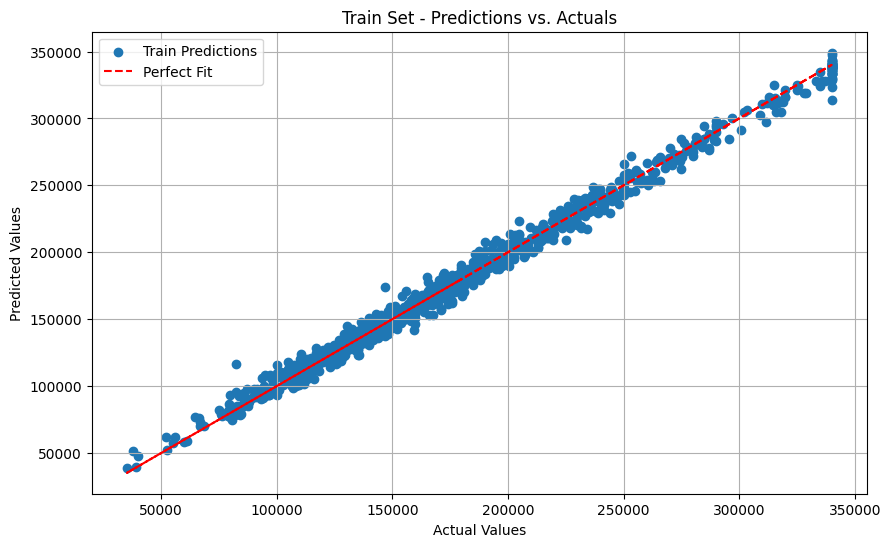

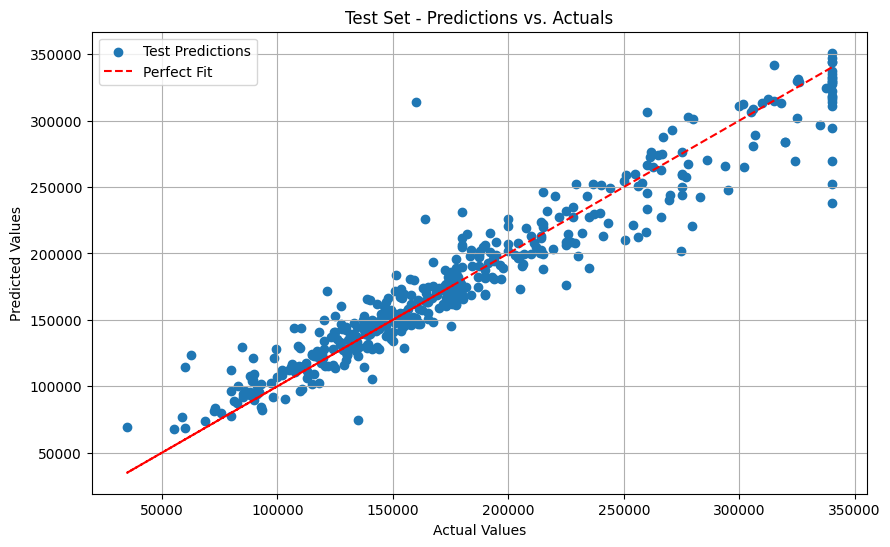

In [59]:
import matplotlib.pyplot as plt

# Train set predictions vs. actuals
plt.figure(figsize=(10, 6))
plt.scatter(y_train, train_prediction, label='Train Predictions')
plt.plot(y_train, y_train, color='red', linestyle='--', label='Perfect Fit')  # Add a reference line for perfect fit
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Train Set - Predictions vs. Actuals')
plt.legend()
plt.grid(True)
plt.show()

# Test set predictions vs. actuals (similar plot for test data)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, test_prediction, label='Test Predictions')
plt.plot(y_test, y_test, color='red', linestyle='--', label='Perfect Fit')  # Add a reference line for perfect fit
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Test Set - Predictions vs. Actuals')
plt.legend()
plt.grid(True)
plt.show()


In [60]:
# Assuming model4 is your trained CatBoost model
x_columns = x_train.columns
feature_rank = pd.DataFrame({'Feature': x_columns, 'Importances (in Percentage)': model4.feature_importances_})
feature_rank = feature_rank.sort_values('Importances (in Percentage)', ascending=False)
feature_rank.head(20)


,Feature,Importances (in Percentage)
73,dataset,45.559550
14,OverallQual,10.688123
43,GrLivArea,8.629970
16,YearBuilt,3.148572
35,TotalBsmtSF,2.829574
58,GarageArea,2.631636
40,1stFlrSF,2.192356
53,Fireplaces,2.169699
24,ExterQual,1.866655
31,BsmtFinSF1,1.757534


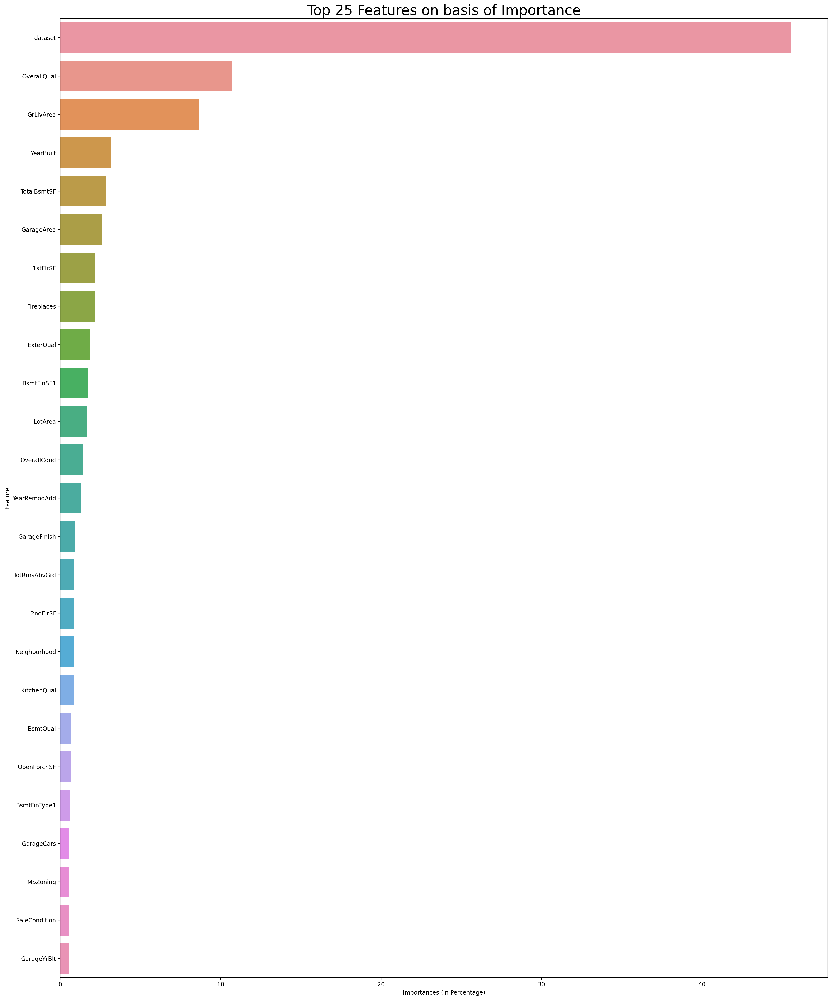

In [61]:
plt.figure(figsize=(20,24), dpi = 200)
plt.title('Top 25 Features on basis of Importance', fontsize = 24)
sns.barplot(x='Importances (in Percentage)', y='Feature', data=feature_rank.iloc[:25, :])
plt.tight_layout()
plt.show()

In [62]:
submission_df = pd.DataFrame({"Id": test_df["Id"], "SalePrice": test_prediction})

In [63]:
submission_df.to_csv("submission.csv", index=False)

In [64]:
submission_df

,Id,SalePrice
178,179.0,337736.333993
1856,1857.0,168266.814533
12,13.0,128224.940849
2028,2029.0,179971.547793
2048,2049.0,176639.024611
2542,2543.0,176752.125122
1208,1209.0,139340.491295
222,223.0,168010.025465
462,463.0,123815.177640
1116,1117.0,190490.061613
